# <img align="right" src="additional_data/banner.png" style="width:1100px;">

# Functions: Surface Water Detection Analysis and Visualization

* [**Sign up to the JupyterHub**](https://www.phenocube.org/) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with both the Open Data Cube implemention environments
* **Products used:** 
[s2_l2a](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi/product-types/level-2a)

## Background

Multiple functions are provided in the water_tsa.py script for surface water analysis and visualization using Sentinel-2 data in the open data cube. The tasks can be done with the following function include data masking, data evaluation, water detection, and time series chart. The following functions are included in the script and will be demonstrated in this notebook:

- **get_bbox**: Get bounding box
- **load_shp**: Load data from shapefile
- **viz2d**: Visualize RGB image
- **to_map**: Interactive color composite
- **sceneDisplay**: Display time series in RGB
- **dataMask**: Mask pixels with unsatisfactory quality
- **getQual**: Evaluate data quality
- **vizQual**: Plot data quality
- **pred_index**: Data preparation
- **water_viz**: Visualize detected water
- **cloud_calc**: Calculate cloud uncertainty
- **water_ts**: Calculate new data frame for water area
- **ts_viz**: Visualize water area from time series data
- **water_gif**: Animation of detected water area
- **water_freq**: Map water occurence.
- **export_freq**: Export raster for water occurence.


## Description

This notebook aims to test functions developed in the **water_tsa.py** and demonstrations its example use case for Bukina Faso open data cube.

The chart below shows recommanded workflow to implement water detection and analysis.

# <img align="center" src="ODC.svg" style="width:1000px;">

***

#### Loading libraries for the functions.

For testing the script, we first need to import the script and datacube. Other libraries required for the functions are automatically loaded.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
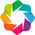

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [1]:
%matplotlib inline
import datacube
import holoviews as hv
from bokeh.plotting import show
from bokeh.io import output_notebook
hv.extension('bokeh')
output_notebook

# Import python script water_ts.py
from water_tsa import *

# Set up data cube environment
dc = datacube.Datacube(app = '1_MNDWI', config = '/home/datacube/.datacube.conf')

### Function get_bbox(): extract bounding box of shapefile
If our area of interest is defined in a shapefile, we can get the bounding box using *get_bbox()*. The following script extract bounding box from **Dano_catchment.shp**. The results are a list of longitude(min, max) and latitude(min, max).

In [2]:
shp = "Dano_catchment.shp"
coords = get_bbox(shp)
print("Longitude = [{},{}]\nLatitude = [{},{}]".format(coords[0],coords[1],coords[2],coords[3]))

Longitude = [-3.1438815919029324,-2.8371328764956667]
Latitude = [11.074515172056097,11.363685094094889]


### Function load_shp(): load data with shapefile
Alternatively, we can load data directly using **.shp** file instead using *load_shp()*. By default, data will be grouped by solar day. Users can choose to import selected spectral bands with the "band" argument.

In [3]:
#data loading

df = load_shp(shp,start="2019-03-01",end="2019-06-01", band=["blue", "green", "red", "nir", "swir1", "scl"])
df

<xarray.Dataset>
Dimensions:      (latitude: 3174, longitude: 3366, time: 19)
Coordinates:
  * time         (time) datetime64[ns] 2019-03-01T10:44:50 ... 2019-05-30T10:...
  * latitude     (latitude) float64 11.36 11.36 11.36 ... 11.07 11.07 11.07
  * longitude    (longitude) float64 -3.144 -3.144 -3.144 ... -2.837 -2.837
    spatial_ref  int32 4326
Data variables:
    blue         (time, latitude, longitude) uint16 1454 1512 1490 ... 856 874
    green        (time, latitude, longitude) uint16 1660 1696 1686 ... 1228 1266
    red          (time, latitude, longitude) uint16 2038 2070 2130 ... 1214 1302
    nir          (time, latitude, longitude) uint16 2900 2990 2978 ... 2608 2614
    swir1        (time, latitude, longitude) uint16 3624 3624 3654 ... 2860 2860
    scl          (time, latitude, longitude) uint8 10 10 10 10 10 ... 5 5 5 5 5
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

### Function viz2d(): Visualize data in RGB
viz2d() allows user to have a first glimpse of our data, so that we can check the location and conditions of our scenes. Both true color composite and false color composite are supported.

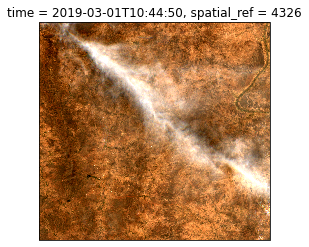

In [4]:
#visualize our scene in true color composite

viz2d(df.isel(time=[0]),r_band='red', g_band='green', b_band='blue')

#### Loading data from another area for lake detection.
To show the functionality for surface water detection, we load the data of an non-permanent lake in Sanmatenga, Bukina Faso.

In [2]:
data = dc.load(product= "s2_l2a_burkinafaso",
               x= (-0.838320, -0.806992),
               y= (12.887174, 12.908550),
               time= ("2015-01-01", "2019-12-01"),
               group_by = "solar_day",
               progress_cbk=with_ui_cbk())

data

<xarray.Dataset>
Dimensions:          (latitude: 235, longitude: 345, time: 212)
Coordinates:
  * time             (time) datetime64[ns] 2016-12-08T10:37:15.500000 ... 201...
  * latitude         (latitude) float64 12.91 12.91 12.91 ... 12.89 12.89 12.89
  * longitude        (longitude) float64 -0.8383 -0.8383 ... -0.8071 -0.807
    spatial_ref      int32 4326
Data variables: (12/13)
    coastal_aerosol  (time, latitude, longitude) uint16 766 766 766 ... 0 0 0
    blue             (time, latitude, longitude) uint16 1078 1224 1294 ... 0 0 0
    green            (time, latitude, longitude) uint16 1688 1886 2060 ... 0 0 0
    red              (time, latitude, longitude) uint16 2452 2822 3006 ... 0 0 0
    veg5             (time, latitude, longitude) uint16 2782 3058 3058 ... 0 0 0
    veg6             (time, latitude, longitude) uint16 2929 3447 3447 ... 0 0 0
    ...               ...
    nir              (time, latitude, longitude) uint16 3404 3720 3880 ... 0 0 0
    narrow_nir       (time, latitude, longitude) uint16 3185 3663 3663 ... 0 0 0
    water_vapour     (time, latitude, longitude) uint16 3308 3308 3308 ... 0 0 0
    swir1            (time, latitude, longitude) uint16 4695 4960 4960 ... 0 0 0
    swir2            (time, latitude, longitude) uint16 3673 3931 3931 ... 0 0 0
    scl              (time, latitude, longitude) uint8 5 5 5 5 5 5 ... 0 0 0 0 0
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

#### Have a glimpse of our data using viz2d again.

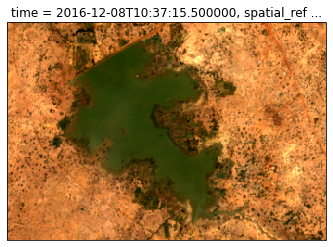

In [3]:
viz2d(data)

### Function to_map() and sceneDisplay(): Interactive Visual Inspection
We can also inspect the area of interest in an interactive map.

In [7]:
to_map(data, downscale=1, basemap = 'hybrid', output='all', zoom = 14)

Instead of one time step, we can also display the whole time series in RGB.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
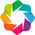

Row
    [0] HoloViews(DynamicMap, widgets={'time': <class '...})
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2016-12-08 ...]), value=numpy.datetime64('2016-12-..., width=250)
        [1] VSpacer()

In [4]:
import holoviews as hv
hv.extension("bokeh")

sceneDisplay(data)

### Function dataMask(): Filter outliners from scene
To further processed, we can first filter our data if outliners exist. *dataMask()* can be used to remove unreasonable reflectance values from the scene, which might affected further analysis. Cloud mask argument can be used to mask cloud which is good for visualization. But it might affect performance for water detection. It is by default set as false.

In [5]:
filteredData = dataMask(data, cloudMask = False)
filteredData

<xarray.Dataset>
Dimensions:          (latitude: 235, longitude: 345, time: 212)
Coordinates:
  * time             (time) datetime64[ns] 2016-12-08T10:37:15.500000 ... 201...
  * latitude         (latitude) float64 12.91 12.91 12.91 ... 12.89 12.89 12.89
  * longitude        (longitude) float64 -0.8383 -0.8383 ... -0.8071 -0.807
    spatial_ref      int32 4326
Data variables: (12/13)
    coastal_aerosol  (time, latitude, longitude) float64 766.0 766.0 ... nan nan
    blue             (time, latitude, longitude) float64 1.078e+03 ... nan
    green            (time, latitude, longitude) float64 1.688e+03 ... nan
    red              (time, latitude, longitude) float64 2.452e+03 ... nan
    veg5             (time, latitude, longitude) float64 2.782e+03 ... nan
    veg6             (time, latitude, longitude) float64 2.929e+03 ... nan
    ...               ...
    nir              (time, latitude, longitude) float64 3.404e+03 ... nan
    narrow_nir       (time, latitude, longitude) float64 3.185e+03 ... nan
    water_vapour     (time, latitude, longitude) float64 3.308e+03 ... nan
    swir1            (time, latitude, longitude) float64 4.695e+03 ... nan
    swir2            (time, latitude, longitude) float64 3.673e+03 ... nan
    scl              (time, latitude, longitude) float64 5.0 5.0 5.0 ... nan nan
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

### Function getQual() and vizQual(): Report and visualize data quality
To better understand the data we loaded, we can make use of the function *getQual()* and *vizQual()*. The former function gives us a list of ratio of good pixels, whereas the latter function directly plot the statistics in a bar chart. The only argument for *getQual()* is a dataframe masked for poor pixels from **dataMask()**, or a unmasked dataframe, in which will the cloud area be the only consideration for the poor pixels, instead of outliners plus cloud cover.

In [6]:
list = getQual(filteredData)
list[0:10]

[100.0, 0.0, 32.0, 0.0, 100.0, 0.0, 100.0, 0.0, 100.0, 0.0]

For *vizQual()*, user can define marked_level and the type of chart, namely line chart and bar chart. markLevel is an optional argument for user to define a custom threshold for highlighting time stamps where qualified pixels are below the threshold.

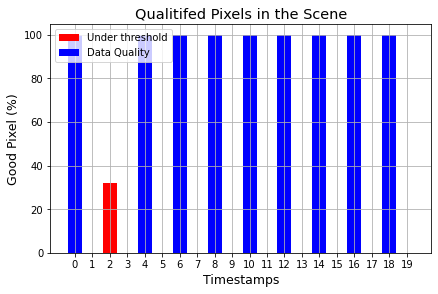

In [7]:
vizQual(filteredData.isel(time=slice(0, 20)), thres = 60)

### Function pred_index(): preparing indices for vegetation and water 
To implement water detection, we need to first make use of *pred_index()*, which helps us to prepare for some indices needed for thresholding to detect water bodies. In this water detection algorithms, **NDVI** and **MNDWI** are used. Resampling is included in the function to obtain monthly average for the time stamps. User can manually adjust the resampling method and frequency, or turn off resampling by setting the argument to "None". drop_band argument is to be used for dropping spectral bands which are used for calculating the indices.

In [8]:
pred = pred_index(data, resample='1M', method="mean", drop_bands=False)
pred

<xarray.Dataset>
Dimensions:          (latitude: 235, longitude: 345, time: 36)
Coordinates:
  * time             (time) datetime64[ns] 2016-12-31 2017-01-31 ... 2019-11-30
  * latitude         (latitude) float64 12.91 12.91 12.91 ... 12.89 12.89 12.89
  * longitude        (longitude) float64 -0.8383 -0.8383 ... -0.8071 -0.807
    spatial_ref      int32 4326
Data variables: (12/17)
    coastal_aerosol  (time, latitude, longitude) float64 823.8 823.8 ... 315.3
    blue             (time, latitude, longitude) float64 806.0 868.3 ... 450.2
    green            (time, latitude, longitude) float64 1.039e+03 ... 711.7
    red              (time, latitude, longitude) float64 1.285e+03 ... 902.5
    veg5             (time, latitude, longitude) float64 1.412e+03 ... 1.089e+03
    veg6             (time, latitude, longitude) float64 1.508e+03 ... 1.345e+03
    ...               ...
    swir2            (time, latitude, longitude) float64 1.801e+03 ... 1.436e+03
    scl              (time, latitude, longitude) float64 3.833 3.833 ... 3.333
    MNDWI            (time, latitude, longitude) float64 -0.3532 ... -0.4717
    NDVI             (time, latitude, longitude) float64 0.1471 ... 0.2442
    water            (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0
    water_null       (time, latitude, longitude) object None None ... None None

### Function water_viz(): visualizing water areas
Then, we can visualize the **detected water areas** in a facet plot using *water_viz()*. We can control the layout  (number of columns) using *col* argument. The results are binary value, with 1 in blue color indicates water occurence.

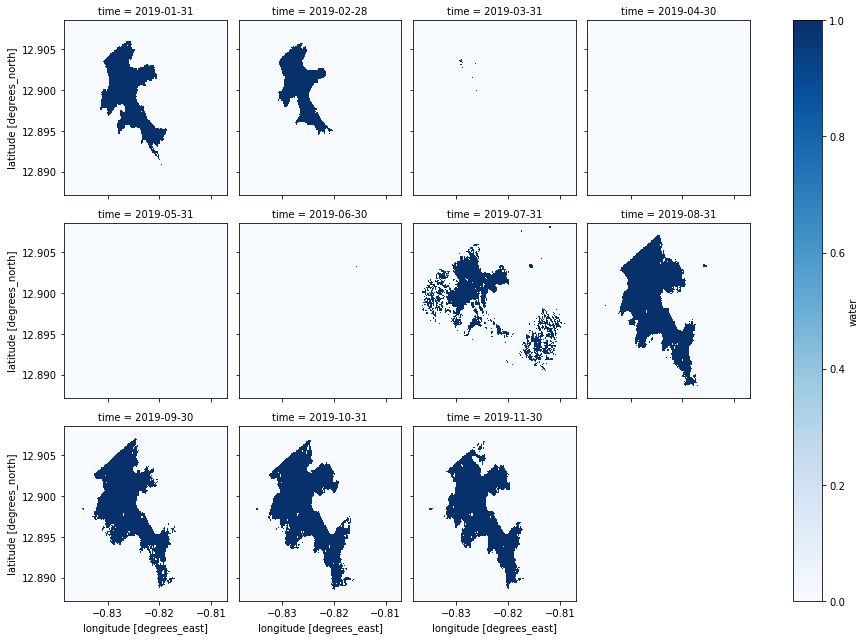

In [13]:
water_viz(pred, col = 4)

### Function water_ts(): preparing statistics for water area and cloud uncertainty
Apart from spatial visualization, statistics can be helpful to understand the water dynamics. Using *water_ts()*, we can preparing a dataframe for calculating water area and cloud uncertainty. The result will be a pandas dataframe with two columns. The units are square kilometers.

In [9]:
df = water_ts(pred)
df

,water_area_km2,cloud_uncertainty_km2
date,,
2016-12-31,0.2755,3.795
2017-01-31,0.9690,3.795
2017-02-28,0.6045,3.795
2017-03-31,0.0090,3.795
2017-04-30,0.0000,3.795
2017-05-31,0.0000,3.795
2017-06-30,0.0768,3.795
2017-07-31,0.7672,3.795
2017-08-31,0.6013,3.795


### Function ts_viz(): Plotting detected water area and cloud uncertainty
We can plot the water area using *ts_viz()*. We can also set up a threshold (relative to maximum area) to highlight the period(s) with water scarcity. 

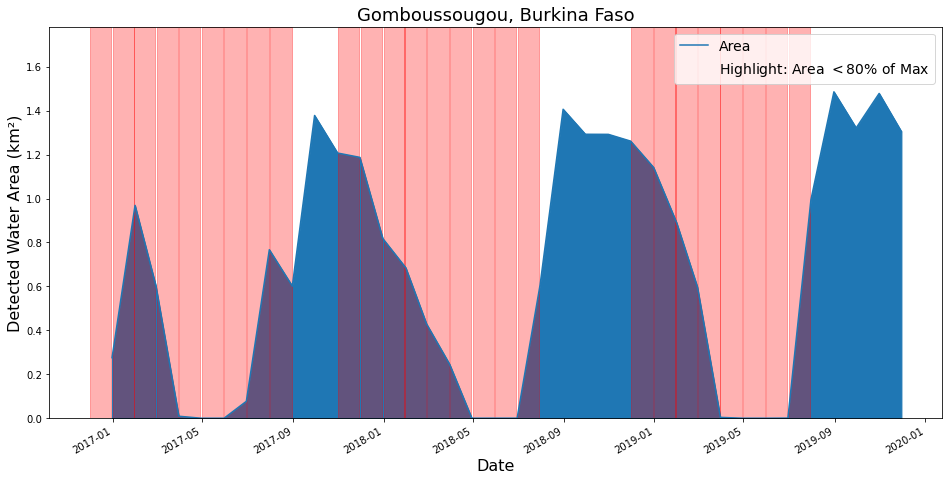

In [10]:
ts_viz(pred, thres=0.8, title="Gomboussougou, Burkina Faso")

In [11]:
ts_viz(pred, interpolate=True, interact=True)

:Curve   [date]   (water_area_km2)

### Function water_gif(): display animation for detected water area
we can display the detected water area with **animation** for better visualization using *water_gif()*. The argument fps defines the frame per second, whereas animate argument define the output as an interactive layer with control panel or gif.

In [17]:
water_gif(pred, fps = 2)

RuntimeError: To use bokeh.io image export functions you need selenium ('conda install selenium' or 'pip install selenium')

:HoloMap   [time]
   :Image   [longitude,latitude]   (water)

### Function water_freq() and export_freq(): display and export water frequency
This function allows us to not only check the water area in each time step, but also understand how frequent are the areas covered by water and how frequent are them drying up. 

In [12]:
water_freq(pred)

We can export the result as tiff file to further analysis the data in GIS application.

In [ ]:
export_freq(pred,path="water_frequency.tif")

#TODO:

#short term

- Water areas on interactive map
- Interactive area plot (time range control with slider and data value pop up)
- Water frequency map
- Linking time series plot and spatial viz together
- RGB animation
- Export tiff

#long term

- Calculate water volumne with bathymetry data
- Integrate climate reanalysis data using google earth engine